In [131]:
from random import gauss as gs
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import TimeSeriesSplit

import itertools
#from pmdarima import auto_arima

#statsmodels
from statsmodels.tsa.arima.model import ARIMA
from statsmodels.tsa.stattools import acf, pacf, adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.statespace.sarimax import SARIMAX
from sklearn.linear_model import ElasticNet
# Standard scaler for preprocessing
from sklearn.preprocessing import StandardScaler

from statsmodels.graphics import tsaplots

import statsmodels.api as sm
import plotly.graph_objects as go

import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

# Definitions to save model results

In [4]:
# Creating an empty dict to save all the erros from different models
dict_error = dict()

In [5]:
# creating function for plotting predicted vs actual energy values
def plot_predvstrue_reg(pred, truth, model_name=None):
    """
    Plots the observed energy consumption against the predicted energy consumption
    """
    fig, ax = plt.subplots(1,1, figsize=(8,8))
    ax.scatter(truth, pred) 
    _ = plt.xlabel("Observed energy in MWH")
    _ = plt.ylabel("Predicted energy in MWH")
    _ = plt.title("Observed vs Predicted energy using model {}".format(model_name))
    _ = plt.xlim(1000, 5000)
    _ = plt.ylim(1000, 5000)
    #plotting 45 deg line to see how the prediction differs from the observed values
    x = np.linspace(*ax.get_xlim())
    _ = ax.plot(x, x)

In [6]:
def error_metrics(y_pred, y_truth, model_name = None, test = True):
    """
    Printing error metrics like RMSE (root mean square error), R2 score, 
    MAE (mean absolute error), MAPE (mean absolute % error). 
    
    y_pred: predicted values of y using the model model_name
    y_truth: observed values of y
    model_name: name of the model used for predictions
    test: if validating on test set, True; otherwise False for training set validation
    
    The function will print the RMSE, R2, MAE and MAPE error metrics for the model_name and also store the results along with 
    model_name in the dictionary dict_error so that we can compare all the models at the end.
    """
    if isinstance(y_pred, np.ndarray):
        y_pred = y_pred
    else:
        y_pred = y_pred.to_numpy()
        
    if isinstance(y_truth, np.ndarray):
        y_truth = y_truth
    else:
        y_truth = y_truth.to_numpy()
        
    print('\nError metrics for model {}'.format(model_name))
    
    RMSE = np.sqrt(mean_squared_error(y_truth, y_pred))
    print("RMSE or Root mean squared error: %.2f" % RMSE)
    
    # Explained variance score: 1 is perfect prediction

    R2 = r2_score(y_truth, y_pred)
    print('Variance score: %.2f' % R2)

    MAE = mean_absolute_error(y_truth, y_pred)
    print('Mean Absolute Error: %.2f' % MAE)

    MAPE = (np.mean(np.abs((y_truth - y_pred) / y_truth)) * 100)
    print('Mean Absolute Percentage Error: %.2f %%' % MAPE)

    # Appending the error values along with the model_name to the dict
    if test:
        train_test = 'test'
    else:
        train_test = 'train'
    
    #df = pd.DataFrame({'model': model_name, 'RMSE':RMSE, 'R2':R2, 'MAE':MAE, 'MAPE':MAPE}, index=[0])
    name_error = ['model', 'train_test', 'RMSE', 'R2', 'MAE', 'MAPE']
    value_error = [model_name, train_test, RMSE, R2, MAE, MAPE]
    list_error = list(zip(name_error, value_error))
    
    for error in list_error:
        if error[0] in dict_error:
            # append the new number to the existing array at this slot
            dict_error[error[0]].append(error[1])
        else:
            # create a new array in this slot
            dict_error[error[0]] = [error[1]]
    return(dict_error)

In [7]:
def plot_timeseries(ts, title = 'og', opacity = 1):
    """
    Plot plotly time series of any given timeseries ts
    """
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = ts.index, y = ts.values, name = "observed",
                         line_color = 'lightslategrey', opacity = opacity))

    fig.update_layout(title_text = title,
                  xaxis_rangeslider_visible = True)
    fig.show()

In [8]:
def plot_ts_pred(og_ts, pred_ts, model_name=None, og_ts_opacity = 0.5, pred_ts_opacity = 0.5):
    """
    Plot plotly time series of the original (og_ts) and predicted (pred_ts) time series values to check how our model performs.
    model_name: name of the model used for predictions
    og_ts_opacity: opacity of the original time series
    pred_ts_opacity: opacity of the predicted time series
    """
    
    fig = go.Figure()

    fig.add_trace(go.Scatter(x = og_ts.index, y = np.array(og_ts.values), name = "Observed",
                         line_color = 'deepskyblue', opacity = og_ts_opacity))

    try:
        fig.add_trace(go.Scatter(x = pred_ts.index, y = pred_ts, name = model_name,
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))
    except: #if predicted values are a numpy array they won't have an index
        fig.add_trace(go.Scatter(x = og_ts.index, y = pred_ts, name = model_name,
                         line_color = 'lightslategrey', opacity = pred_ts_opacity))


    #fig.add_trace(go)
    fig.update_layout(title_text = 'Observed test set vs predicted energy MWH values using {}'.format(model_name),
                  xaxis_rangeslider_visible = True)
    fig.show()

In [9]:
def train_test(data, test_size = 0.25, scale = False, cols_to_transform=None, include_test_scale=False):
    """
    
        Perform train-test split with respect to time series structure
        
        - df: dataframe with variables X_n to train on and the dependent output y which is the column 'SDGE' in this notebook
        - test_size: size of test set
        - scale: if True, then the columns in the -'cols_to_transform'- list will be scaled using StandardScaler
        - include_test_scale: If True, the StandardScaler fits the data on the training as well as the test set; if False, then
          the StandardScaler fits only on the training set.
        
    """
    df = data.copy()
    # get the index after which test set starts
    test_index = int(len(df)*(1-test_size))
    
    # StandardScaler fit on the entire dataset
    if scale and include_test_scale:
        scaler = StandardScaler()
        df[cols_to_transform] = scaler.fit_transform(df[cols_to_transform])
        
    X_train = df.drop('SDGE', axis = 1).iloc[:test_index]
    y_train = df.SDGE.iloc[:test_index]
    X_test = df.drop('SDGE', axis = 1).iloc[test_index:]
    y_test = df.SDGE.iloc[test_index:]
    
    # StandardScaler fit only on the training set
    if scale and not include_test_scale:
        scaler = StandardScaler()
        X_train[cols_to_transform] = scaler.fit_transform(X_train[cols_to_transform])
        X_test[cols_to_transform] = scaler.transform(X_test[cols_to_transform])
    
    return X_train, X_test, y_train, y_test

# Loading Data

In [10]:
SDGE_TW = pd.read_csv('SDGE_W.csv')

In [11]:
# Dropping unnecessary columns and setting date as index
SDGE_TW = SDGE_TW.drop('Unnamed: 0', axis=1)
SDGE_TW.set_index("Date", inplace =True)
SDGE_TW.index = pd.to_datetime(SDGE_TW.index)

In [12]:
SDGE_TW.head()

,SDGE,year,month,day,hour,weekday,season,holiday,HourlyDryBulbTemperature,HourlyRelativeHumidity,HourlyWindSpeed
Date,,,,,,,,,,,
2019-01-01 00:00:00,2372.497411,2019,1,1,0,Tuesday,winter,1,49.0,71.0,0.0
2019-01-01 01:00:00,2698.751137,2019,1,1,1,Tuesday,winter,0,47.0,77.0,5.0
2019-01-01 02:00:00,2777.672120,2019,1,1,2,Tuesday,winter,0,47.0,63.0,6.0
2019-01-01 03:00:00,2799.193829,2019,1,1,3,Tuesday,winter,0,47.0,52.0,6.0
2019-01-01 04:00:00,2761.883322,2019,1,1,4,Tuesday,winter,0,46.5,51.5,5.5


In [13]:
# creating categorical columns for linear regression 
cat_cols = ['year', 'month', 'day', 'hour', 'weekday', 'season', 'holiday']

for col in cat_cols:
    SDGE_TW[col] = SDGE_TW[col].astype('category')

In [14]:
# Preparing dummy columns for use in sklearn's linear regression 
SDGE_TW_Lin = pd.get_dummies(SDGE_TW, drop_first = True)

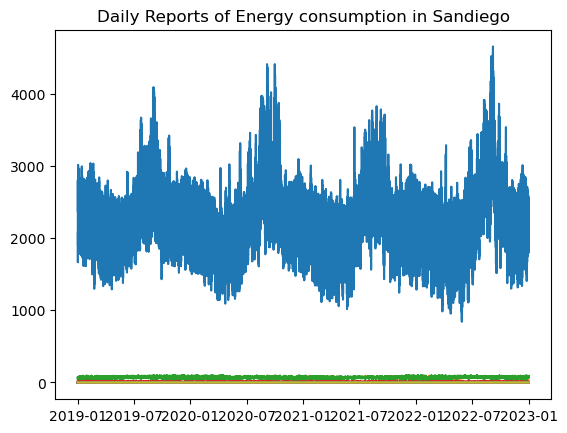

In [15]:
fig, ax = plt.subplots()
ax.plot(SDGE_TW_Lin)
ax.set_title("Daily Reports of Energy consumption in Sandiego");

# Pre Processing

In [62]:
# Using Linear Regression to analyse feature importance and pick on trends 

In [ ]:
lin = ols.

In [16]:
# Creating a simple time series dataframe
th_sdge = pd.DataFrame(SDGE_TW["SDGE"], columns=['SDGE'])

In [17]:
th_sdge.head()

,SDGE
Date,
2019-01-01 00:00:00,2372.497411
2019-01-01 01:00:00,2698.751137
2019-01-01 02:00:00,2777.672120
2019-01-01 03:00:00,2799.193829
2019-01-01 04:00:00,2761.883322


Date
2019-01-01 00:00:00     43.285239
2019-01-01 01:00:00    149.527611
2019-01-01 02:00:00    330.518297
2019-01-01 03:00:00    351.247265
2019-01-01 04:00:00    407.755806
Name: seasonal, dtype: float64


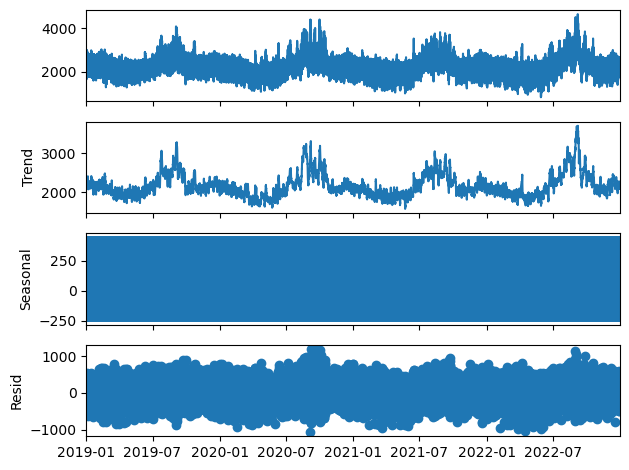

In [18]:
decomp = sm.tsa.seasonal_decompose(th_sdge)  
# Print the first few values of the seasonal component 
print(decomp.seasonal.head())  
# Plot the decomposition 
_ = decomp.plot() 

In [19]:
th_sdge['seasonal'] = decomp.seasonal

In [21]:
th_sdge['trend'] = decomp.trend

<Axes: xlabel='Date'>

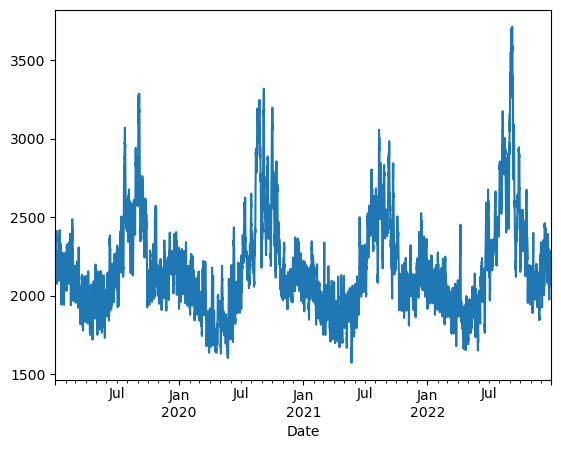

In [22]:
# Plotting the trend 
th_sdge['trend'].dropna().plot()

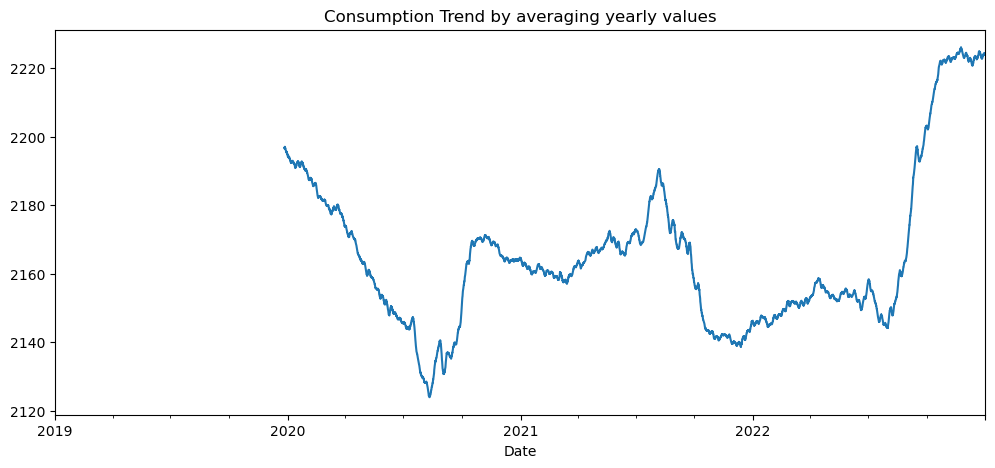

In [23]:
# Plotting the half yearly rolling average of the time series to check trend (mean consumption)

_ = SDGE_TW['SDGE'].rolling(window = 24*30*12).mean().plot(figsize=(12,5))
_ = plt.title('Consumption Trend by averaging yearly values')

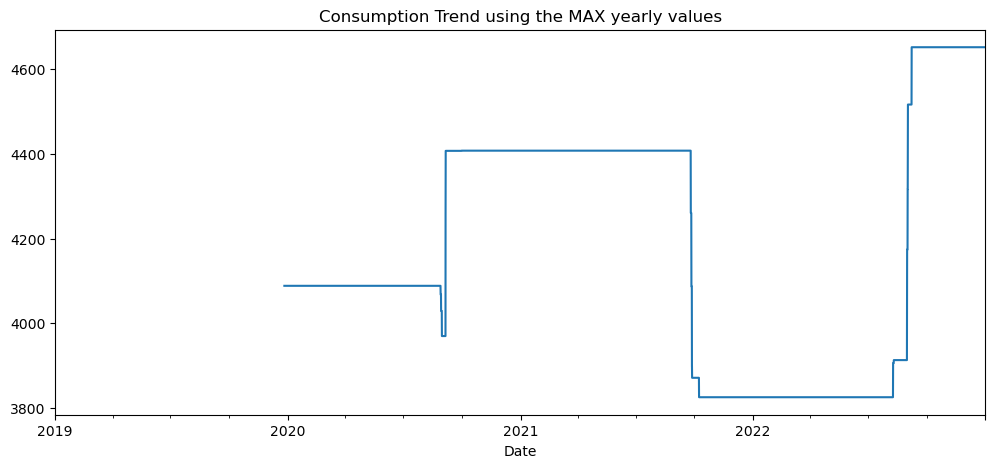

In [24]:
# Plotting the quartely rolling MAX of the time series to check trend
_ = SDGE_TW['SDGE'].rolling(window = 24*30*12).max().plot(figsize=(12,5))
_ = plt.title('Consumption Trend using the MAX yearly values')

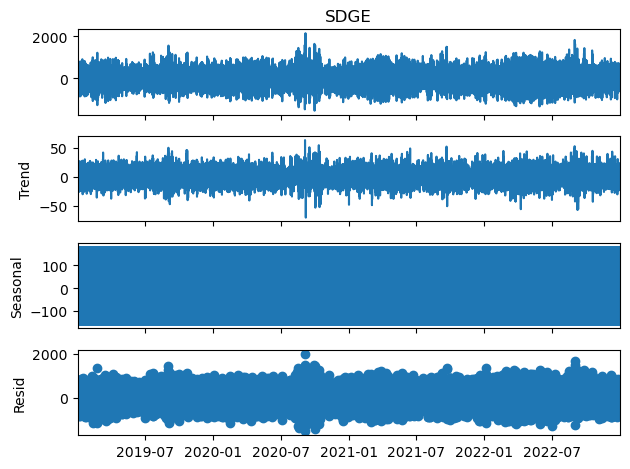

In [25]:
# Differencing the data once

decomp_diff1 = sm.tsa.seasonal_decompose(th_sdge['SDGE'].diff().dropna()) 
_ = decomp_diff1.plot()

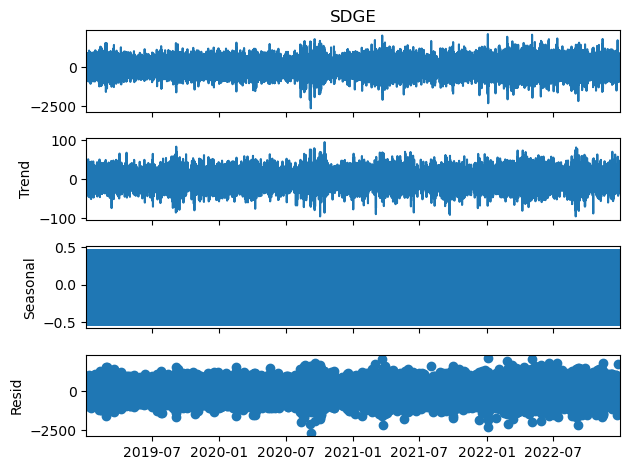

In [26]:
# Differencing the data with periodicity of 24 hours in addition to the original single differencing

decomp_diff24 = sm.tsa.seasonal_decompose(th_sdge['SDGE'].diff().dropna().diff(24).dropna()) 
_ = decomp_diff24.plot()

# Testing for stationarity 
Based on the provided information, the test statistic is -8.697959e+00 and the p-value is 3.878533e-14. 
If the p-value is less than the significance level (commonly 0.05), we reject the null hypothesis 
and conclude that the time series is stationary. 

In this case, the p-value (3.878533e-14) is much smaller than the significance level (0.05), 
indicating strong evidence against the null hypothesis. We can therefore conclude that the time series is stationary.

In [27]:
ts_sdge = pd.DataFrame(SDGE_TW["SDGE"], columns=['SDGE'])

In [28]:
ts_test = adfuller(ts_sdge)
display(ts_test)

(-8.69795881318699,
 3.878533167943309e-14,
 52,
 35011,
 {'1%': -3.43053679213716,
  '5%': -2.8616225575095284,
  '10%': -2.566813942767471},
 475245.4656370086)

In [29]:
# Extract and display test results in a user friendly manner
dfoutput = pd.Series(
                ts_test[0:4], 
                index=['Test Statistic','p-value','#Lags Used','Number of Observations Used']
)

for key,value in ts_test[4].items():
    dfoutput['Critical Value (%s)'%key] = value
    
display(dfoutput)

Test Statistic                -8.697959e+00
p-value                        3.878533e-14
#Lags Used                     5.200000e+01
Number of Observations Used    3.501100e+04
Critical Value (1%)           -3.430537e+00
Critical Value (5%)           -2.861623e+00
Critical Value (10%)          -2.566814e+00
dtype: float64

# Exponential Smoothing
Exponential smoothing is a time series forecasting method that assigns exponentially decreasing weights to past observations. 

With an alpha value of 0.5, the model considers the most recent data point to be equally important as the previous forecast in predicting the future values.

The visual predicted values are close to the actual values, suggesting that the exponential smoothing model is capturing the underlying trend or pattern in the data reasonably well, smoothing out the noise or random fluctuations.

However Exponential smoothing is relatively a simple forcasting method and may fail to capture all complexities, we're also using just time as a variable without weather consideration. We'll explore other models to account for seasonality and fluctuations since our data has seasonal fluctuations on weekly and monthly bases.

The visualization was helpful in picking seasonal trends within hourly forcast that the decomposition method wasn't able to pick on.

In [55]:
# Defining a function to plot exponentially smoothed data
def plot_ewma(ts, alpha):
    expw_ma = ts.ewm(alpha=alpha).mean()
    
    plot_ts_pred(ts, expw_ma, model_name='Exponentially smoothed data with alpha = {}'.format(alpha), \
                 og_ts_opacity = 0.5, pred_ts_opacity = 0.5)

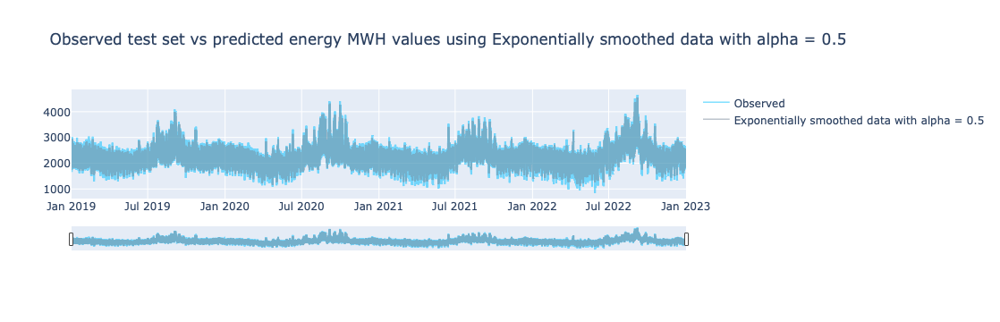

In [60]:
# Plotting the exponentially smoothed energy consumption data with alpha=0.5
plot_ewma(ts_sdge['SDGE'], 0.5)

# Autocorrelation
Autocorrelation and partial autocorrelation are statistical measures used to analyze the relationship between observations in a time series data.

Autocorrelation (ACF):
Autocorrelation measures the linear relationship between an observation and its lagged values. It helps identify any patterns or dependencies in the data that are related to its past values. The autocorrelation function (ACF) is a plot that shows the correlation coefficient between the observations at different lags.

Interpretation of ACF:
- If the ACF plot shows a significant positive autocorrelation at lag 1, it suggests that the current observation is positively correlated with the previous observation. This indicates a trend or persistence in the data.
- If the ACF plot shows a significant negative autocorrelation at lag 1, it suggests that the current observation is negatively correlated with the previous observation. This indicates a reversal or mean-reversion pattern in the data.
- If the ACF plot shows significant autocorrelation at multiple lags, it suggests the presence of a seasonal or cyclical pattern in the data.

Partial Autocorrelation (PACF):
Partial autocorrelation measures the direct relationship between an observation and its lagged values, while controlling for the intermediate lags. It helps identify the direct influence of past observations on the current observation, without the influence of the intermediate lags.

Interpretation of PACF:
- If the PACF plot shows a significant partial autocorrelation at lag 1 and no significant partial autocorrelation at other lags, it suggests a first-order autoregressive (AR) process. This means that the current observation is directly influenced by the previous observation.
- If the PACF plot shows a significant partial autocorrelation at lag 1 and significant partial autocorrelation at other lags, it suggests a higher-order AR process. This means that the current observation is influenced by multiple past observations.
- If the PACF plot shows significant partial autocorrelation at multiple lags, it suggests the presence of a seasonal or cyclical pattern in the data.

It is important to note that the interpretation of autocorrelation and partial autocorrelation can vary depending on the specific characteristics of the data and the context of the analysis. It is recommended to use these measures in conjunction with other diagnostic tools and statistical tests to gain a comprehensive understanding of the time series data.

In [32]:
def acf_pacf_plots(ts, lags, figsize = (12,8)):
    
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize = figsize)
    
    # Plot the ACF of ts
    _ = plot_acf(ts, lags = lags, zero = False, ax = ax1, alpha = 0.05)

    # Plot the PACF of ts
    _ = plot_pacf(ts, lags = lags, zero = False, ax = ax2, alpha = 0.05)

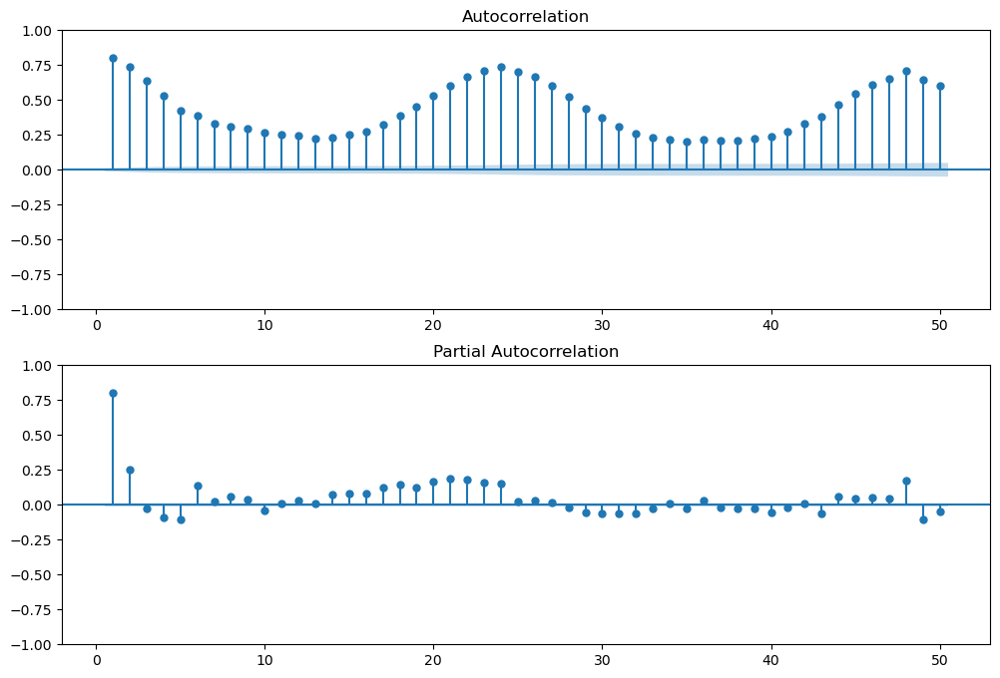

In [33]:
# Create the acf and pacf plots

dfacf = []
dfacf = ts_sdge['SDGE']
lags = 50

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))

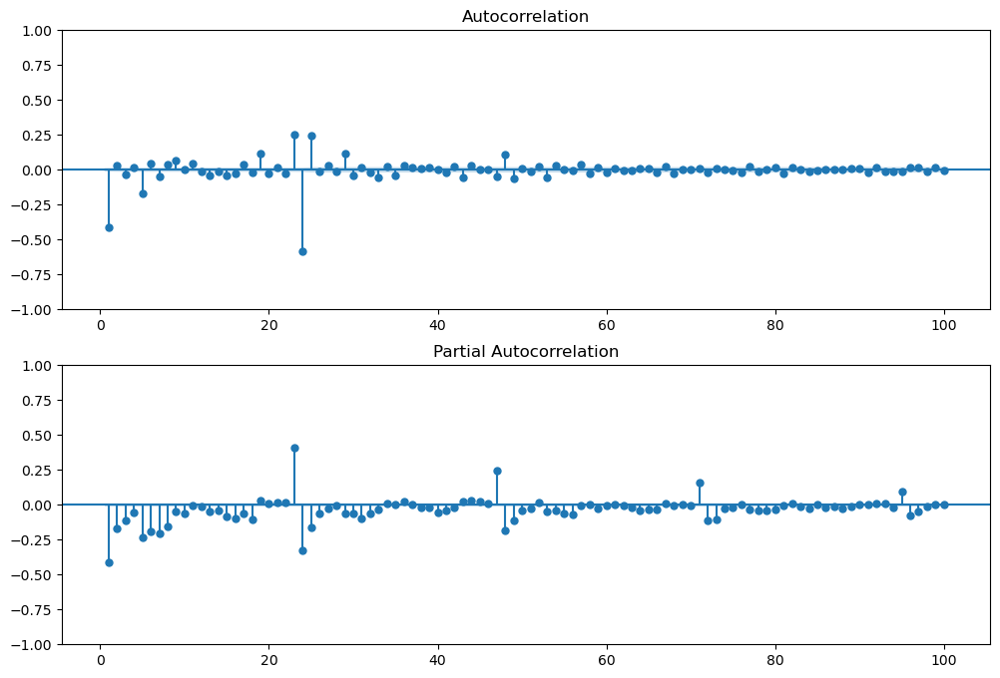

In [34]:
# Differencing the data this time to remove the trend and seasonality
dfacf = []
dfacf = ts_sdge['SDGE']
dfacf = dfacf.diff().dropna() #Previous hour diff 
dfacf = dfacf.diff(24).dropna() # Daily diff our value 24h prior
dfacf = dfacf.diff(24*365).dropna() #Yearly diff
lags = 100

acf_pacf_plots(dfacf, lags = lags, figsize = (12,8))

# Baseline Model
## Persistant Forcast
Using the RMSE metric the average magnitude of the errors between the predicted values and the actual values. The output of 420.73 indicates that, on average, the predictions from the naive forecast model have an error of approximately 420.73 MW on a daily bases when compared to the actual values of the test dataset.

On an hourly bases the baseline model is on average off the actual value by 296.49 MW. with a MAPE of 12.49% and accuracy of 87.51%.

Will be opting to reduce the error between predicted and and actual values using this naive model as a baseline.

In [35]:
cols_to_transform = ['HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlyWindSpeed'] # other columns are binary values
X_train, X_test, y_train, y_test = train_test(SDGE_TW_Lin, test_size = 0.15, scale = True, cols_to_transform=cols_to_transform)

In [36]:
# Calculating the errors for persistent forecast (where we simply repeat the values from last year)
_ = error_metrics(SDGE_TW_Lin.loc[X_test.index.shift(-8760, freq='H'), 'SDGE'], 
                  y_test, model_name='Baseline Persistent forecast, repeat last year', test=True)


Error metrics for model Baseline Persistent forecast, repeat last year
RMSE or Root mean squared error: 420.73
Variance score: 0.30
Mean Absolute Error: 304.72
Mean Absolute Percentage Error: 12.49 %


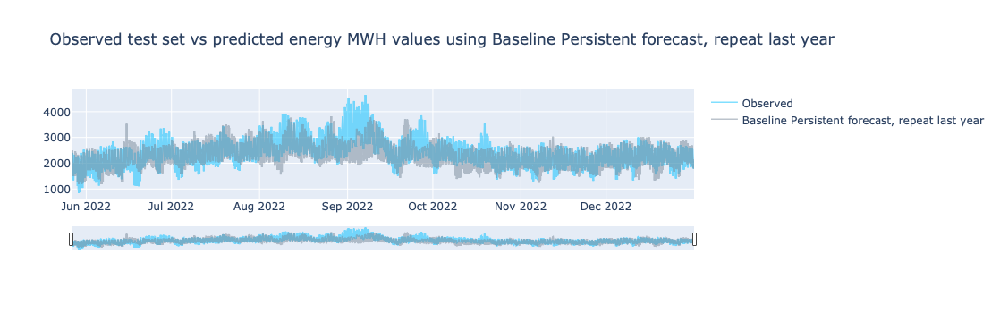

In [37]:
plot_ts_pred(y_test, SDGE_TW_Lin.loc[X_test.index.shift(-8760, freq='H'), 'SDGE'].to_numpy(),
             model_name='Baseline Persistent forecast, repeat last year')

In [38]:
# Resampling both the y_test and predictions at a 24 hours period and using the max as the aggregate function
_ = error_metrics(SDGE_TW_Lin.loc[X_test.index.shift(-8760, freq='H'), 'SDGE'].resample('24h').max(), 
                  y_test.resample('24h').max(), 
                  model_name='Baseline Persistent forecast, repeat last year; daily MAX', test=True)


Error metrics for model Baseline Persistent forecast, repeat last year; daily MAX
RMSE or Root mean squared error: 410.95
Variance score: 0.26
Mean Absolute Error: 275.01
Mean Absolute Percentage Error: 8.53 %


In [39]:
print('error on hour ahead persistent forecast')
_ = error_metrics(SDGE_TW_Lin.loc[X_test.index.shift(-1, freq='H'), 'SDGE'], 
                  y_test, model_name='Baseline Persistent forecast, repeat last hour', test=True)

error on hour ahead persistent forecast

Error metrics for model Baseline Persistent forecast, repeat last hour
RMSE or Root mean squared error: 296.49
Variance score: 0.65
Mean Absolute Error: 210.37
Mean Absolute Percentage Error: 9.30 %


# Lag Variables

In [40]:
# Creating the lag variables
for i in range(24):
    SDGE_TW_Lin['lag'+str(i+1)] = SDGE_TW_Lin['SDGE'].shift(i+1)

In [130]:
SDGE_TW_Lin

,SDGE,HourlyDryBulbTemperature,HourlyRelativeHumidity,HourlyWindSpeed,year_2020,year_2021,year_2022,month_2,month_3,month_4,...,lag15,lag16,lag17,lag18,lag19,lag20,lag21,lag22,lag23,lag24
Date,,,,,,,,,,,,,,,,,,,,,
2019-01-01 00:00:00,2372.497411,49.000000,71.000000,0.000000,False,False,False,False,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-01 01:00:00,2698.751137,47.000000,77.000000,5.000000,False,False,False,False,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-01 02:00:00,2777.672120,47.000000,63.000000,6.000000,False,False,False,False,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-01 03:00:00,2799.193829,47.000000,52.000000,6.000000,False,False,False,False,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2019-01-01 04:00:00,2761.883322,46.500000,51.500000,5.500000,False,False,False,False,False,False,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2022-12-31 19:00:00,1848.860000,61.000000,81.000000,10.000000,False,False,True,False,False,False,...,2172.14,2567.19,2406.09,2263.16,2157.37,1906.67,2367.37,1858.61,1955.53,1843.58
2022-12-31 20:00:00,1857.700000,61.000000,78.000000,8.000000,False,False,True,False,False,False,...,2453.80,2172.14,2567.19,2406.09,2263.16,2157.37,1906.67,2367.37,1858.61,1955.53
2022-12-31 21:00:00,2035.800000,61.000000,79.500000,10.000000,False,False,True,False,False,False,...,2361.13,2453.80,2172.14,2567.19,2406.09,2263.16,2157.37,1906.67,2367.37,1858.61


In [41]:
# Since the first 24 values won't have any 24th lag, they will be NaN. So dropping the NaNs
SDGE_TW_lag = SDGE_TW_Lin.dropna()

In [42]:
SDGE_TW_lag.head(1)

,SDGE,HourlyDryBulbTemperature,HourlyRelativeHumidity,HourlyWindSpeed,year_2020,year_2021,year_2022,month_2,month_3,month_4,...,lag15,lag16,lag17,lag18,lag19,lag20,lag21,lag22,lag23,lag24
Date,,,,,,,,,,,,,,,,,,,,,
2019-01-02,2485.555484,49.0,21.0,6.0,False,False,False,False,False,False,...,1670.220977,1663.96211,1707.867671,1955.86012,2300.870096,2761.883322,2799.193829,2777.67212,2698.751137,2372.497411


In [43]:
# Fitting Elastic Net Regression model using the lag variables as the additional inputs ...
cols_to_transform = ['HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlyWindSpeed']
# Adding the energy consumption lags to the columns to transform 
list_lags = ['lag'+str(i+1) for i in range(24)]
cols_to_transform.extend(list_lags)

X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test(SDGE_TW_lag, \
                                                              test_size = 0.15, scale = True, \
                                                              cols_to_transform=cols_to_transform)

In [44]:
elastic_net_lag = ElasticNet(l1_ratio = 1, alpha=0.2)
elastic_net_lag.fit(X_train_lag, y_train_lag)

ElasticNet(alpha=0.2, l1_ratio=1)

In [45]:
ElasticNet(alpha=0.2, copy_X=True, fit_intercept=True, l1_ratio=1,
           max_iter=1000, positive=False, precompute=False,
           random_state=None, selection='cyclic', tol=0.0001, warm_start=False)

ElasticNet(alpha=0.2, l1_ratio=1)

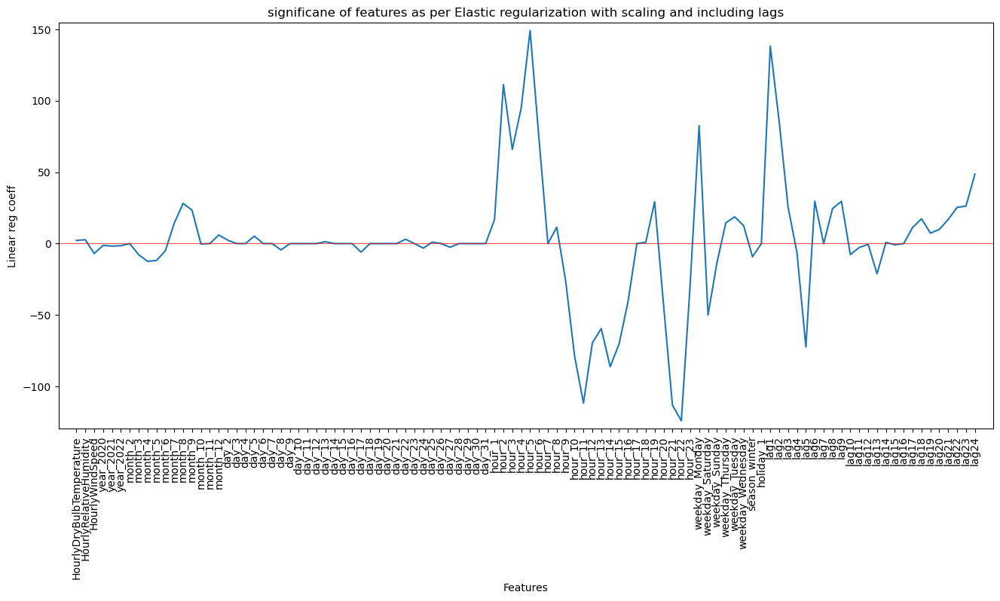

In [46]:
# Plot the coefficients
_ = plt.figure(figsize = (16, 7))
_ = plt.plot(range(len(X_train_lag.columns)), elastic_net_lag.coef_)
_ = plt.xticks(range(len(X_train_lag.columns)), X_train_lag.columns.values, rotation = 90)
_ = plt.margins(0.02)
_ = plt.axhline(0, linewidth = 0.5, color = 'r')
_ = plt.title('significane of features as per Elastic regularization with scaling and including lags')
_ = plt.ylabel('Linear reg coeff')
_ = plt.xlabel('Features')

In [47]:
#### The year on year consumption being around 0 makes sense and day's on average don't seem to have much effect
#### I'll create a weekend and working days columns and remove days 

# Random Forest

In [48]:
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(10, 200, 10, endpoint=True)]
max_features = ['auto', 'sqrt']
max_depth = list(range(1,6))
# Create the random grid
random_grid = {'n_estimators': n_estimators, 'max_features': max_features, 'max_depth':max_depth}
print(random_grid)

{'n_estimators': [10, 31, 52, 73, 94, 115, 136, 157, 178, 200], 'max_features': ['auto', 'sqrt'], 'max_depth': [1, 2, 3, 4, 5]}


In [49]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import RandomizedSearchCV
# First create the base model to tune
rf = RandomForestRegressor()
tscv = TimeSeriesSplit(n_splits=5)
# Random search of parameters
rflag = RandomizedSearchCV(estimator = rf, param_distributions = random_grid, 
                               cv = tscv, verbose=2, random_state = 42, n_jobs = -1)

# Fit the random search model
rflag.fit(X_train_lag, y_train_lag)

rflag.best_params_

Fitting 5 folds for each of 10 candidates, totalling 50 fits


{'n_estimators': 10, 'max_features': 'sqrt', 'max_depth': 4}

In [50]:
# comparison of scores using elastic net and RF on the lag dataset
print('Random forest errors with lags on training')
error_metrics(rflag.predict(X_train_lag), y_train_lag, model_name = 'Random forest with all lags', test=False)
print('\nRandom forest errors with lags on test')
error_metrics(rflag.predict(X_test_lag), y_test_lag, model_name = 'Random forest with all lags', test=True)
print('\nElastic net errors with lags on train')
error_metrics(elastic_net_lag.predict(X_train_lag), y_train_lag, model_name = 'Elastic net with all lags', test=False)
print('\nElastic net errors with lags on test')
error_metrics(elastic_net_lag.predict(X_test_lag), y_test_lag, model_name = 'Elastic net with all lags', test=True)

Random forest errors with lags on training

Error metrics for model Random forest with all lags
RMSE or Root mean squared error: 249.89
Variance score: 0.65
Mean Absolute Error: 190.51
Mean Absolute Percentage Error: 9.22 %

Random forest errors with lags on test

Error metrics for model Random forest with all lags
RMSE or Root mean squared error: 276.84
Variance score: 0.70
Mean Absolute Error: 206.02
Mean Absolute Percentage Error: 8.76 %

Elastic net errors with lags on train

Error metrics for model Elastic net with all lags
RMSE or Root mean squared error: 209.41
Variance score: 0.75
Mean Absolute Error: 154.47
Mean Absolute Percentage Error: 7.46 %

Elastic net errors with lags on test

Error metrics for model Elastic net with all lags
RMSE or Root mean squared error: 226.32
Variance score: 0.80
Mean Absolute Error: 166.90
Mean Absolute Percentage Error: 7.35 %


{'model': ['Baseline Persistent forecast, repeat last year',
  'Baseline Persistent forecast, repeat last year; daily MAX',
  'Baseline Persistent forecast, repeat last hour',
  'Random forest with all lags',
  'Random forest with all lags',
  'Elastic net with all lags',
  'Elastic net with all lags'],
 'train_test': ['test', 'test', 'test', 'train', 'test', 'train', 'test'],
 'RMSE': [420.73426041962404,
  410.9451760029692,
  296.490764134328,
  249.89049235655216,
  276.8443724252905,
  209.41460987958484,
  226.3198237874132],
 'R2': [0.3029493190305046,
  0.25809927778617237,
  0.6538447375499447,
  0.6488412413805638,
  0.6979934004182642,
  0.7533858487024085,
  0.7981679057748579],
 'MAE': [304.7246805008175,
  275.0093091454546,
  210.36636870258556,
  190.51163291623504,
  206.01799682154206,
  154.47255623896862,
  166.89796987636439],
 'MAPE': [12.48723007264615,
  8.529669282671238,
  9.298709253838371,
  9.219024194090746,
  8.764193924736961,
  7.464908225266592,
  7.34

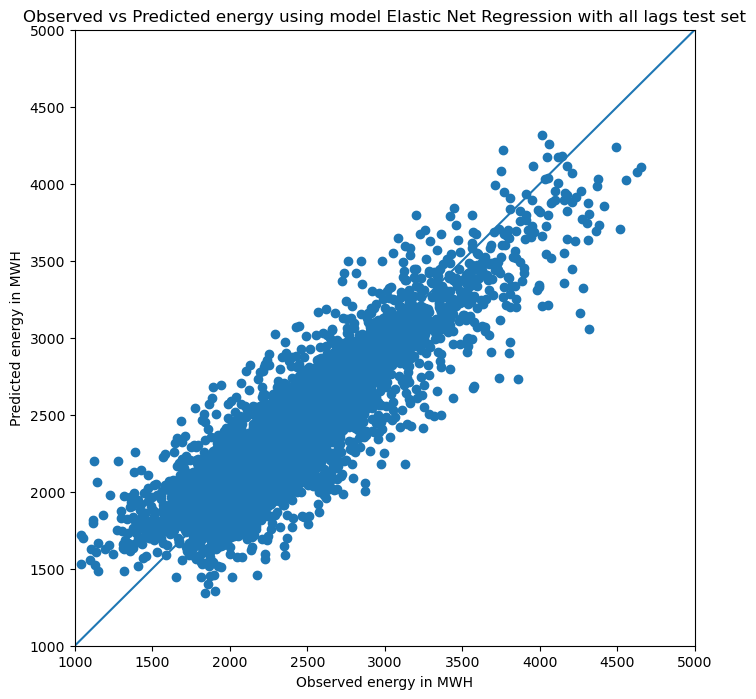

In [51]:
plot_predvstrue_reg(elastic_net_lag.predict(X_test_lag), y_test_lag, 
                    model_name = 'Elastic Net Regression with all lags test set')

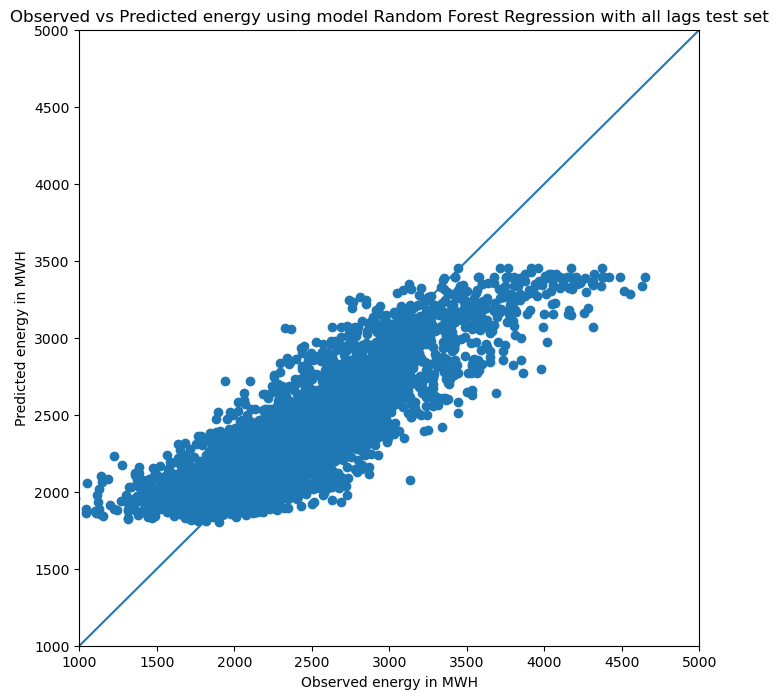

In [52]:
plot_predvstrue_reg(rflag.predict(X_test_lag), y_test_lag, 
                    model_name = 'Random Forest Regression with all lags test set')

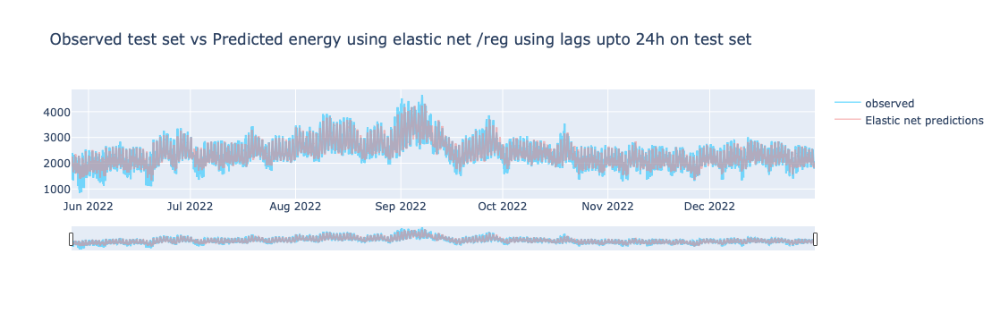

In [72]:
# Plotting the observed test values, and predicted test values using the above Elastic net and Random forest models using lags
#..up to last 24 hour values

fig = go.Figure()

fig.add_trace(go.Scatter(x = X_test_lag.index, y = np.array(y_test_lag), name = "observed",
                         line_color = 'deepskyblue', opacity = 0.5))


fig.add_trace(go.Scatter(x = X_test_lag.index, y = elastic_net_lag.predict(X_test_lag), name = "Elastic net predictions",
                         line_color = 'lightcoral', opacity = 0.5))

fig.update_layout(title_text = 'Observed test set vs Predicted energy using elastic net /reg using lags upto 24h on test set',
                  xaxis_rangeslider_visible = True)
fig.show()

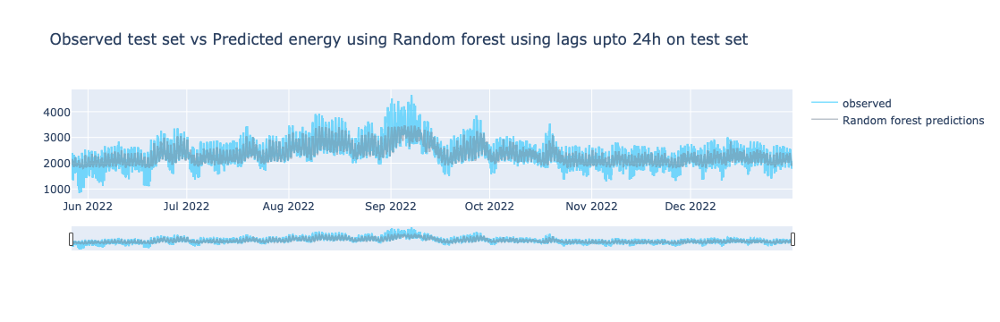

In [71]:
fig = go.Figure()

fig.add_trace(go.Scatter(x = X_test_lag.index, y = np.array(y_test_lag), name = "observed",
                         line_color = 'deepskyblue', opacity = 0.5))

fig.add_trace(go.Scatter(x = X_test_lag.index, y = rflag.predict(X_test_lag), name = "Random forest predictions",
                         line_color = 'lightslategrey', opacity = 0.5))

# fig.add_trace(go.Scatter(x = X_test_lag.index, y = elastic_net_lag.predict(X_test_lag), name = "Elastic net predictions",
#                          line_color = 'lightcoral', opacity = 0.5))

fig.update_layout(title_text = 'Observed test set vs Predicted energy using Random forest using lags upto 24h on test set',
                  xaxis_rangeslider_visible = True)
fig.show()

# SARIMA
>- From the preprocessing we did, the auto correlation was able to show multiple seasonality even when we differenced it out to remove seasonality and trends.
>- Another way to handle this is use Fourier Terms with SARIMA, methods below were adopted from [Skorupa's](https://medium.com/intive-developers/forecasting-time-series-with-multiple-seasonalities-using-tbats-in-python-398a00ac0e8a) blog on forcasting timeseries with multiple seasonality 

In [76]:
import warnings
warnings.filterwarnings('ignore')

# We can add multiple fourer series with different k terms in the (2*k*pi) such as k=1,2,3...etc. To generalize the problem, 
# we could have chosen an optimal k value for each season by trying out some k values and choosing the values giving 
#the lowest AIC.

def add_fourier_terms(df, year_k, week_k, day_k):
    """
    df: dataframe to add the fourier terms to 
    year_k: the number of Fourier terms the year period should have. Thus the model will be fit on 2*year_k terms (1 term for 
    sine and 1 for cosine)
    week_k: same as year_k but for weekly periods
    day_k:same as year_k but for daily periods
    """
    
    for k in range(1, year_k+1):
        # year has a period of 365.25 including the leap year
        df['year_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.dayofyear/365.25) 
        df['year_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.dayofyear/365.25)

    for k in range(1, week_k+1):
        
        # week has a period of 7
        df['week_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.dayofweek/7)
        df['week_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.dayofweek/7)


    for k in range(1, day_k+1):
        
        # day has period of 24
        df['hour_sin'+str(k)] = np.sin(2 *k* np.pi * df.index.hour/24)
        df['hour_cos'+str(k)] = np.cos(2 *k* np.pi * df.index.hour/24) 

In [78]:
warnings.filterwarnings('ignore')

# as said above the k terms for each yearly, weekly and daily seasonalities could be chosen by optimizing on the AIC values..
# but after some research on energy consumption time series k= 5 was chosen for each seasonality
add_fourier_terms(SDGE_TW_lag, year_k= 5, week_k=5 , day_k=5)

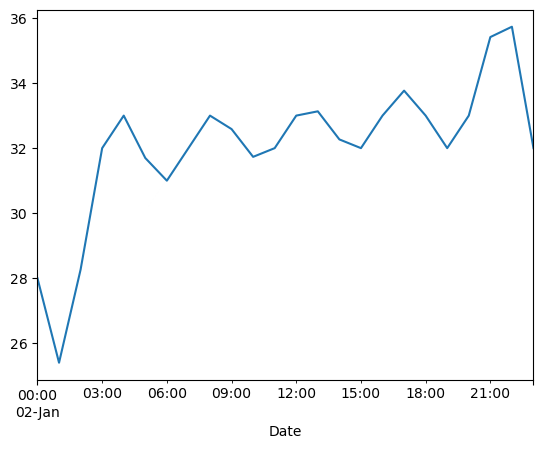

In [82]:
# Visualizing the new variables on hour seasonality
pd.plotting.register_matplotlib_converters()
_ = (1-SDGE_TW_lag.loc['01-02-2019':'01-02-2019', [col for col in SDGE_TW_lag if col.startswith('hour')]]).sum(axis = 1).plot()

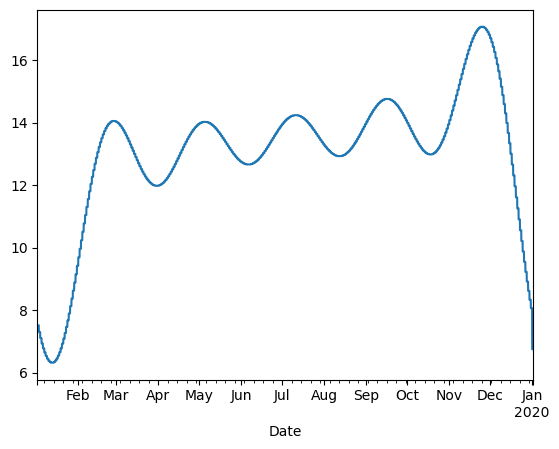

In [84]:
# Visualizing the new variables on year seasonality
_ = (1-SDGE_TW_lag.loc['01-01-2019':'01-01-2020', [col for col in SDGE_TW_lag if col.startswith('year')]]).sum(axis = 1).plot()

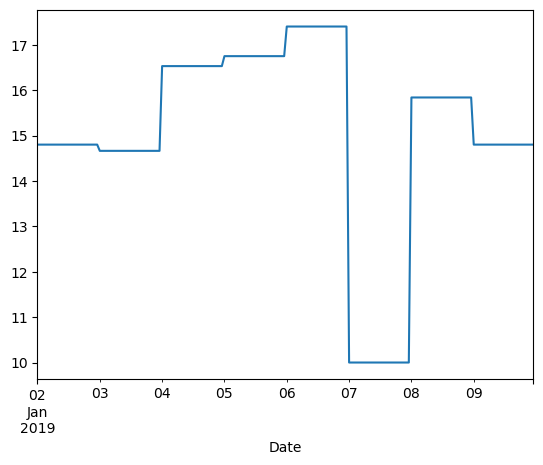

In [86]:
# Visualizing the new variables on week seasonality
_ = (1-SDGE_TW_lag.loc['01-01-2019':'01-09-2019', [col for col in SDGE_TW_lag if col.startswith('week')]]).sum(axis = 1).plot()

In [87]:
SDGE_TW_lag.columns

Index(['SDGE', 'HourlyDryBulbTemperature', 'HourlyRelativeHumidity',
       'HourlyWindSpeed', 'year_2020', 'year_2021', 'year_2022', 'month_2',
       'month_3', 'month_4',
       ...
       'hour_sin1', 'hour_cos1', 'hour_sin2', 'hour_cos2', 'hour_sin3',
       'hour_cos3', 'hour_sin4', 'hour_cos4', 'hour_sin5', 'hour_cos5'],
      dtype='object', length=133)

In [118]:
# Choosing a subset of the above dataframe; removing the lags and the hour bins
sdgefr = SDGE_TW_lag.drop([col for col in SDGE_TW_lag if 
                         col.startswith('time') or col.startswith('season') or col.startswith('lag')] or col.startwith('day'), axis=1)

In [119]:
# not adding year variable here because the model will use the most recent lag energy consumption values
cols_to_transform = ['HourlyDryBulbTemperature', 'HourlyRelativeHumidity', 'HourlyWindSpeed']  
X_train_lag, X_test_lag, y_train_lag, y_test_lag = train_test(sdgefr, 
                                                              test_size = 0.15, scale = True, 
                                                              cols_to_transform=cols_to_transform)

# Since ARIMA model uses the past lag y values, scaling the energy values as well. 
#i.e. fit the scaler on y_train and transform it and also transform y_test using the same scaler if required later

scaler1 = StandardScaler()
y_train_lag = pd.DataFrame(scaler1.fit_transform(y_train_lag.values.reshape(-1,1)), index = y_train_lag.index, 
                           columns = ['SDGE'])
# y_test_lag = scaler1.transform(y_test_lag)

In [125]:
y_train_lag = y_train_lag.astype(float)

In [126]:
X_train_lag = X_train_lag.astype(float)

In [115]:
# Got the optimal SARIMAX order from running the above auto_arima function. It took more than 2 hours to get the optimal...
#...solution. So, just using the final values here
model_opt = SARIMAX(y_train_lag, order=(2,1,1), seasonal_order=(1, 0, 1, 24), exog = X_train_lag, trend='c', enforce_stationarity=False)

In [116]:
results = model_opt.fit()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          114     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f=  6.91745D+09    |proj g|=  4.69903D+11


 This problem is unconstrained.



At iterate    5    f=  7.03587D+04    |proj g|=  4.75504D+05

At iterate   10    f=  4.53868D+01    |proj g|=  1.54276D+04
  ys=-1.432E-11  -gs= 2.916E-06 BFGS update SKIPPED



 Bad direction in the line search;
   refresh the lbfgs memory and restart the iteration.



At iterate   15    f=  1.95342D+01    |proj g|=  1.40230D+04
  ys=-8.004E-03  -gs= 2.603E+02 BFGS update SKIPPED

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
  114     18    142      2     2     0   1.402D+04   1.927D+01
  F =   19.270813324964710     

STOP: TOTAL NO. of f AND g EVALUATIONS EXCEEDS LIMIT        


In [117]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                     SARIMAX Results                                      
==========================================================================================
Dep. Variable:                               SDGE   No. Observations:                29784
Model:             SARIMAX(2, 1, 1)x(1, 0, 1, 24)   Log Likelihood             -573961.904
Date:                            Thu, 09 Nov 2023   AIC                        1148151.808
Time:                                    19:21:25   BIC                        1149098.102
Sample:                                01-02-2019   HQIC                       1148455.555
                                     - 05-26-2022                                         
Covariance Type:                              opg                                         
============================================================================================
                               coef    std err          z      P>|z|      [0.025      0.975]
--------------------------------------------------------------------------------------------
intercept                   -0.0001      0.001     -0.113      0.910      -0.002       0.002
HourlyDryBulbTemperature    -0.0814      0.004    -23.010      0.000      -0.088      -0.074
HourlyRelativeHumidity      -0.0182      0.002     -9.401      0.000      -0.022      -0.014
HourlyWindSpeed              0.0044      0.001      6.221      0.000       0.003       0.006
year_2020                    4.0870      0.054     75.818      0.000       3.981       4.193
year_2021                    8.8182      0.061    144.528      0.000       8.699       8.938
year_2022                   13.0705      0.066    197.355      0.000      12.941      13.200
month_2                      0.5001      0.038     13.253      0.000       0.426       0.574
month_3                      1.0975      0.049     22.278      0.000       1.001       1.194
month_4                      1.9098      0.057     33.529      0.000       1.798       2.021
month_5                      2.5000      0.066     38.059      0.000       2.371       2.629
month_6                      1.6876      0.073     23.136      0.000       1.545       1.831
month_7                      2.5534      0.078     32.566      0.000       2.400       2.707
month_8                      3.1056      0.076     40.960      0.000       2.957       3.254
month_9                      3.8179      0.073     52.435      0.000       3.675       3.961
month_10                     4.8168      0.070     68.765      0.000       4.680       4.954
month_11                     4.6422      0.059     78.718      0.000       4.527       4.758
month_12                     4.6214      0.041    113.467      0.000       4.542       4.701
day_2                        0.1364      0.017      7.934      0.000       0.103       0.170
day_3                        0.3032      0.030     10.047      0.000       0.244       0.362
day_4                        0.2339      0.040      5.875      0.000       0.156       0.312
day_5                        0.3018      0.046      6.491      0.000       0.211       0.393
day_6                        0.1933      0.050      3.837      0.000       0.095       0.292
day_7                        0.0162      0.052      0.312      0.755      -0.086       0.118
day_8                        0.0331      0.052      0.635      0.525      -0.069       0.135
day_9                       -0.0413      0.051     -0.810      0.418      -0.141       0.059
day_10                      -0.1210      0.048     -2.520      0.012      -0.215      -0.027
day_11                       0.0907      0.044      2.041      0.041       0.004       0.178
day_12                       0.0742      0.039      1.883      0.060      -0.003       0.151
day_13                       0.0372      0.036      1.046      0.296      -0.033       0.107
day_14                       0.0761      0.032      2.346      0

In [123]:
y_test_lag = y_test_lag.astype(float)
X_test_lag = X_test_lag.astype(float)

In [127]:
# pred = results.get_prediction(start=X_train_lag.index[-24*7], end=X_train_lag.index[-1], 
#                               dynamic=True, exog=X_train_lag.iloc[-24*7:, :])
# pred_ci = pred.conf_int()

# pred1 = scaler1.inverse_transform(pred.predicted_mean)
# pred_ci1 = scaler1.inverse_transform(pred.conf_int())

# y_actual_train = np.squeeze(scaler1.inverse_transform(y_train_lag))
# y_actual_train = pd.Series(y_actual_train, index = X_train_lag.index )

# pred1 = pd.Series(pred1, index = X_train_lag.iloc[-24*7:, :].index )
# pred_ci1 = pd.DataFrame(pred_ci1, index = pred1.index, columns = ['lower SDGE', 'upper SDGE'])

# lower_limits = pred_ci1.loc[:,'lower SDGE']
# upper_limits = pred_ci1.loc[:,'upper SDGE']

ValueError: Expected 2D array, got 1D array instead:
array=[ 2.71911621e-01  9.51477051e-01  1.86352539e+00  3.00250244e+00
  3.39111328e+00  3.71411133e+00  4.01635742e+00  4.88281250e+00
  5.14910889e+00  5.99444580e+00  7.08593750e+00  8.55651855e+00
  8.86767578e+00  1.22686157e+01  1.33873291e+01  1.55544434e+01
  1.67665405e+01  2.05951538e+01  2.25609741e+01  2.61077271e+01
  2.76500854e+01  3.23689575e+01  3.57764282e+01  4.26401978e+01
  4.54330444e+01  5.38641357e+01  5.80584717e+01  6.92838135e+01
  7.34021606e+01  8.62237549e+01  9.06878052e+01  1.07793579e+02
  1.13309204e+02  1.34370544e+02  1.40215271e+02  1.67186218e+02
  1.73835754e+02  2.09973633e+02  2.17260803e+02  2.60793030e+02
  2.68163513e+02  3.25083923e+02  3.33191895e+02  4.04490051e+02
  4.10785706e+02  5.01869690e+02  5.08064880e+02  6.25444824e+02
  6.28313965e+02  7.77867859e+02  7.75557495e+02  9.67868347e+02
  9.56458801e+02  1.20148346e+03  1.17679504e+03  1.49248663e+03
  1.44932068e+03  1.85421332e+03  1.78176117e+03  2.30292645e+03
  2.19077197e+03  2.86431250e+03  2.69387787e+03  3.55998468e+03
  3.30734149e+03  4.42754865e+03  4.06114954e+03  5.50808600e+03
  4.98041937e+03  6.85305542e+03  6.10557092e+03  8.53279846e+03
  7.47897021e+03  1.06262192e+04  9.15429205e+03  1.32412999e+04
  1.11951432e+04  1.65049047e+04  1.36759738e+04  2.05845690e+04
  1.66923069e+04  2.56867665e+04  2.03482575e+04  3.20703867e+04
  2.47767877e+04  4.00693582e+04  3.01301181e+04  5.00916768e+04
  3.65823103e+04  6.26650886e+04  4.43465327e+04  7.84501348e+04
  5.36566943e+04  9.82823427e+04  6.47901846e+04  1.23226954e+05
  7.80541373e+04  1.54626008e+05  9.37881646e+04  1.94190461e+05
  1.12361839e+05  2.44089039e+05  1.34159005e+05  3.07089677e+05
  1.59569135e+05  3.86715052e+05  1.88940201e+05  4.87457969e+05
  2.22551718e+05  6.15066733e+05  2.60528199e+05  7.76878005e+05
  3.02734955e+05  9.82300350e+05  3.48639568e+05  1.24338923e+06
  3.97070805e+05  1.57561857e+06  4.45929849e+05  1.99888262e+06
  4.91738129e+05  2.53876934e+06  5.29034433e+05  3.22825183e+06
  5.49527107e+05  4.10984782e+06  5.40921723e+05  5.23846652e+06
  4.85322544e+05  6.68508388e+06  3.57009873e+05  8.54154979e+06
  1.19451589e+05  1.09268687e+07 -2.78815333e+05  1.39953606e+07
 -9.09754506e+05  1.79473840e+07 -1.87336962e+06  2.30433041e+07
 -3.30794731e+06  2.96218015e+07 -5.40383701e+06  3.81238523e+07
 -8.42207873e+06  4.91241258e+07 -1.27194576e+07  6.33721959e+07
 -1.87822044e+07  8.18465778e+07 -2.72712658e+07  1.05825709e+08
 -3.90830289e+07  1.36981159e+08 -5.54307542e+07  1.77500154e+08
 -7.79535859e+07  2.30246704e+08 -1.08862480e+08  2.98973539e+08
 -1.51135310e+08  3.88601110e+08 -2.08777580e+08  5.05584918e+08
 -2.87170641e+08  6.58399393e+08 -3.93536405e+08  8.58175551e+08].
Reshape your data either using array.reshape(-1, 1) if your data has a single feature or array.reshape(1, -1) if it contains a single sample.